<a href="https://colab.research.google.com/github/BrijeshBavda/INSE-6220-/blob/main/Brijesh_Bavda(40195927)_INSE_6220_Project_Win_22.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Multiclass Classification of Raisin Using Pycaret** 

In this project i have used Binary classification to classify raisin into one of two classes using pycaret. Binary classification is supervised classification technique which classifies instances in one of two classes. 

In [80]:
!pip install pycaret==2.3.6

In [81]:
from pycaret.utils import version
version()

'2.3.6'

In [82]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style="darkgrid")
import pandas as pd
plt.rcParams['figure.figsize'] = (7,5)

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [83]:
print("Pandas version: ", pd.__version__)
print("Seaborn version: ", sns.__version__)

Pandas version:  1.3.5
Seaborn version:  0.11.2


**Data Set**

In this data set machine vision system was used to distinguish between two different variety of Raisin produced in Turkey - Besni and kecimen.
firstly, a total of 900 raisin seed were collected with equal amount of both raisin seeds. later, it was classified based on 7 features using image processing method. Image processing was performed in MATLAB software. The images collected by camera were firsly converted to grayscale image and then to binary image to extract 7 features.

To construct the data following 7 features were used:

**Area**: Gives the number of pixels within the boundaries of the raisin grain.

**Perimeter**: It measures the environment by calculating the distance between the boundaries of the raisin grain and the pixels around it.

**MajorAxisLength**: Gives the length of the main axis, which is the longest line that can be drawn on the raisin grain.

**MinorAxisLength**: Gives the length of the small axis, which is the shortest line that can be drawn on the raisin grain.

**Eccentricity**: It gives a measure of the eccentricity of the ellipse, which has the same moments as raisins.

**ConvexArea**: Gives the number of pixels of the smallest convex shell of the region formed by the raisin grain.

**Extent**: Gives the ratio of the region formed by the raisin grain to the total pixels in the bounding box.

**Resource**: https://www.kaggle.com/datasets/muratkokludataset/raisin-dataset

**Citation**:

CINAR I., KOKLU M. and TASDEMIR S., (2020). Classification of Raisin Grains Using Machine Vision and Artificial Intelligence Methods, Gazi Journal of Engineering Sciences, vol. 6, no. 3, pp. 200-209, December, 2020, DOI: https://doi.org/10.30855/gmbd.2020.03.03


In [84]:
!pip install -q xlrd
import pandas as pd
df = pd.read_excel('Raisin_Dataset.xlsx')
df.head(25)

,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,Extent,Perimeter,Class
0,87524,442.246011,253.291155,0.819738,90546,0.758651,1184.040,Kecimen
1,75166,406.690687,243.032436,0.801805,78789,0.684130,1121.786,Kecimen
2,90856,442.267048,266.328318,0.798354,93717,0.637613,1208.575,Kecimen
3,45928,286.540559,208.760042,0.684989,47336,0.699599,844.162,Kecimen
4,79408,352.190770,290.827533,0.564011,81463,0.792772,1073.251,Kecimen
5,49242,318.125407,200.122120,0.777351,51368,0.658456,881.836,Kecimen
6,42492,310.146072,176.131449,0.823099,43904,0.665894,823.796,Kecimen
7,60952,332.455472,235.429835,0.706058,62329,0.743598,933.366,Kecimen
8,42256,323.189607,172.575926,0.845499,44743,0.698031,849.728,Kecimen
9,64380,366.964842,227.771615,0.784056,66125,0.664376,981.544,Kecimen


In [85]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 900 entries, 0 to 899
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             900 non-null    int64  
 1   MajorAxisLength  900 non-null    float64
 2   MinorAxisLength  900 non-null    float64
 3   Eccentricity     900 non-null    float64
 4   ConvexArea       900 non-null    int64  
 5   Extent           900 non-null    float64
 6   Perimeter        900 non-null    float64
 7   Class            900 non-null    object 
dtypes: float64(5), int64(2), object(1)
memory usage: 56.4+ KB


In [86]:
# to change class column into unique values 
df ['Class'].unique()
# to count the class variables 
df ['Class'][df['Class']=='Kecimen'].value_counts()
df ['Class'][df ['Class']=='Besni'].value_counts()

labels, levels = pd.factorize(df['Class'])
df['Class']= labels

In [87]:
# to convert string to numeric     


for i in range(0, len(df.columns)):
	df.iloc[:,i] = pd.to_numeric(df.iloc[:,i], errors='ignore')

In [88]:
print("Number of duplicated rows is: ", df.duplicated().sum())

Number of duplicated rows is:  0


In [89]:
print("Number of rows with NaNs is: ", df.isna().any(axis=1).sum())

Number of rows with NaNs is:  0


**Exploratory Data Analysis**

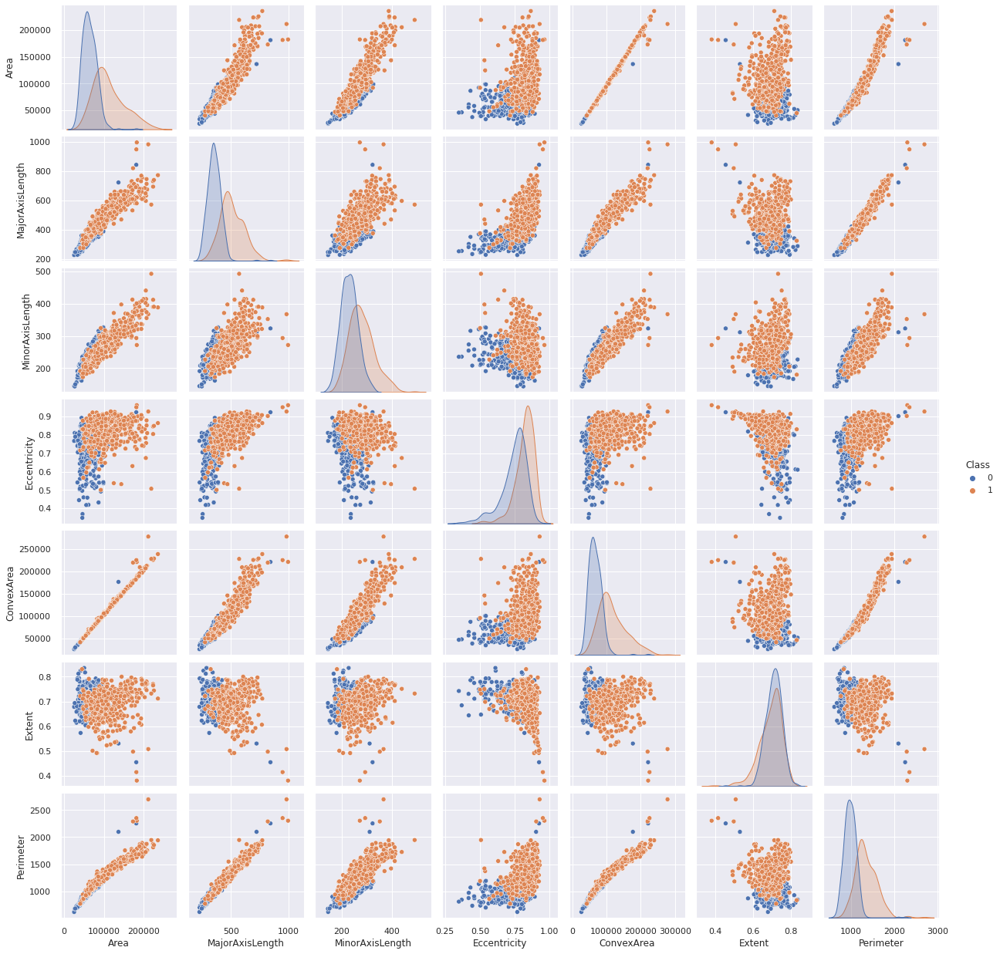

In [90]:
sns.pairplot(df, hue='Class')
plt.show()

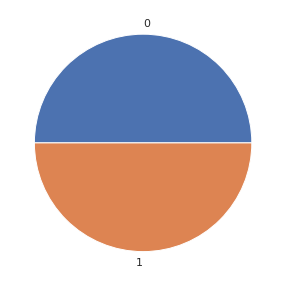

In [91]:
y =df['Class']
y.value_counts().plot(kind='pie')
plt.ylabel('')
plt.show()

**Data Matrix**

In [92]:
X = df.drop(columns=['Class'])
X.head(10)

,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,Extent,Perimeter
0,87524,442.246011,253.291155,0.819738,90546,0.758651,1184.040
1,75166,406.690687,243.032436,0.801805,78789,0.684130,1121.786
2,90856,442.267048,266.328318,0.798354,93717,0.637613,1208.575
3,45928,286.540559,208.760042,0.684989,47336,0.699599,844.162
4,79408,352.190770,290.827533,0.564011,81463,0.792772,1073.251
5,49242,318.125407,200.122120,0.777351,51368,0.658456,881.836
6,42492,310.146072,176.131449,0.823099,43904,0.665894,823.796
7,60952,332.455472,235.429835,0.706058,62329,0.743598,933.366
8,42256,323.189607,172.575926,0.845499,44743,0.698031,849.728
9,64380,366.964842,227.771615,0.784056,66125,0.664376,981.544


In [93]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Area,900.0,87804.127778,39002.111390,25387.000000,59348.000000,78902.000000,105028.250000,235047.000000
MajorAxisLength,900.0,430.929950,116.035121,225.629541,345.442898,407.803951,494.187014,997.291941
MinorAxisLength,900.0,254.488133,49.988902,143.710872,219.111126,247.848409,279.888575,492.275279
Eccentricity,900.0,0.781542,0.090318,0.348730,0.741766,0.798846,0.842571,0.962124
ConvexArea,900.0,91186.090000,40769.290132,26139.000000,61513.250000,81651.000000,108375.750000,278217.000000
Extent,900.0,0.699508,0.053468,0.379856,0.670869,0.707367,0.734991,0.835455
Perimeter,900.0,1165.906636,273.764315,619.074000,966.410750,1119.509000,1308.389750,2697.753000


**Standardize the data**

In [94]:
Xs = StandardScaler().fit_transform(X)
Xcols = X.columns
X = pd.DataFrame(Xs)
X.columns = Xcols
X.head(10)

,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,Extent,Perimeter
0,-0.007186,0.097577,-0.023958,0.423142,-0.015709,1.106743,0.066274
1,-0.324217,-0.209012,-0.229292,0.224476,-0.304248,-0.287777,-0.161252
2,0.078292,0.097758,0.236988,0.186239,0.062113,-1.158250,0.155945
3,-1.074286,-1.245051,-0.915273,-1.069623,-1.076165,0.001711,-1.175915
4,-0.215393,-0.678958,0.727354,-2.409827,-0.238623,1.745259,-0.338639
5,-0.989269,-0.972699,-1.088166,-0.046427,-0.977212,-0.768202,-1.038224
6,-1.162433,-1.041504,-1.568353,0.460367,-1.160393,-0.629029,-1.250349
7,-0.688862,-0.849133,-0.381463,-0.836226,-0.708208,0.825066,-0.849891
8,-1.168487,-0.929031,-1.639519,0.708518,-1.139802,-0.027639,-1.155572
9,-0.600920,-0.551563,-0.534746,0.027845,-0.615047,-0.657433,-0.673810


In [95]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Area,900.0,8.590813e-16,1.000556,-1.601242,-0.730010,-0.228374,0.441866,3.777353
MajorAxisLength,900.0,9.967336e-17,1.000556,-1.770279,-0.737144,-0.199413,0.545458,4.883667
MinorAxisLength,900.0,-1.076793e-15,1.000556,-2.217269,-0.708091,-0.132898,0.508404,4.759444
Eccentricity,900.0,9.029814e-16,1.000556,-4.794739,-0.440641,0.191694,0.676084,2.000508
ConvexArea,900.0,-3.103999e-17,1.000556,-1.596379,-0.728228,-0.234009,0.421867,4.590095
Extent,900.0,1.368288e-15,1.000556,-5.981678,-0.535921,0.147067,0.664006,2.543983
Perimeter,900.0,8.049117e-17,1.000556,-1.998568,-0.729119,-0.169574,0.520748,5.598604


**Observations and variables**

In [96]:
observations = list(df.index)
variables = list(df.columns)

**Box and Whisker plots**

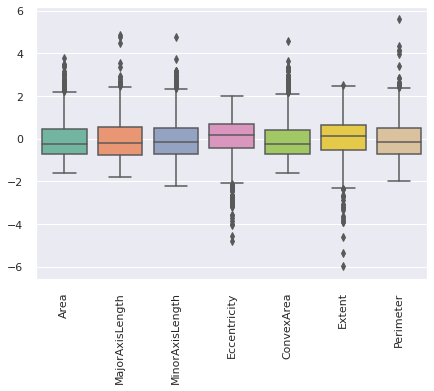

In [97]:
ax = plt.figure()
ax = sns.boxplot(data=X, orient="v", palette="Set2")
ax.set_xticklabels(ax.get_xticklabels(),rotation=90);

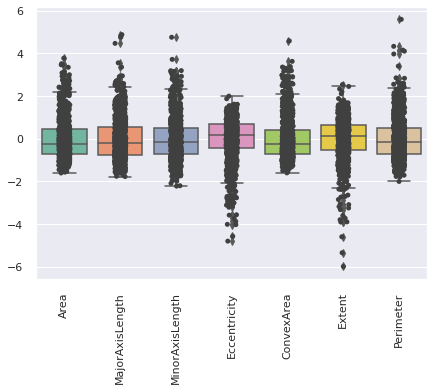

In [98]:
ax = plt.figure()    
ax = sns.boxplot(data=X, orient="v", palette="Set2")
ax = sns.stripplot(data=X, color=".25") 
ax.set_xticklabels(ax.get_xticklabels(),rotation=90);

**Coorelation Matrix**

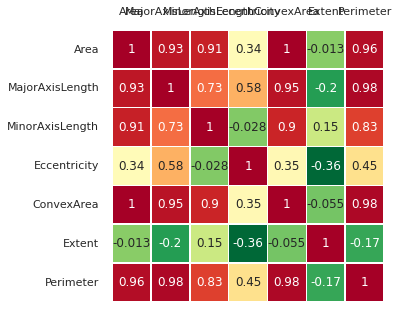

In [99]:
ax = sns.heatmap(X.corr(), cmap='RdYlGn_r', linewidths=0.5, annot=True, cbar=False, square=True)
plt.yticks(rotation=0)
ax.tick_params(labelbottom=False,labeltop=True)
ax.set_xticklabels(ax.get_xticklabels(),rotation=0);

# **Principal Component Analysis**

Text(0, 0.5, '$Z_2$')

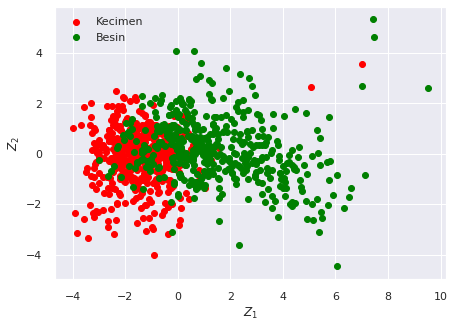

In [100]:
pca = PCA()
Z = pca.fit_transform(X)

idx_1 = np.where(y == 0)
idx_2 = np.where(y == 1)

plt. figure()
plt.scatter(Z[idx_1,0], Z[idx_1,1], c='red', label='Kecimen')
plt.scatter(Z[idx_2,0], Z[idx_2,1], c='green', label='Besin')
plt.legend()
plt.xlabel('$Z_1$')
plt.ylabel('$Z_2$')



**Eigen vectors**

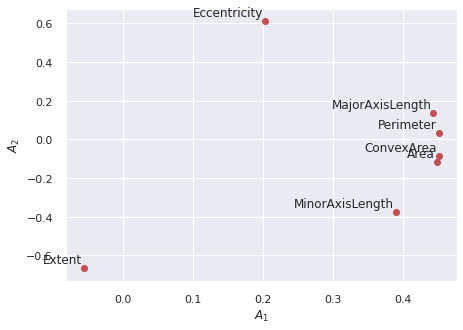

In [101]:
A = pca.components_.T 

plt.scatter(A[:,0],A[:,1],c='r')
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for label, x, y in zip(variables, A[:, 0], A[:, 1]):
  plt.annotate(label, xy=(x, y), xytext=(-2, 2), textcoords='offset points', ha='right', va='bottom')

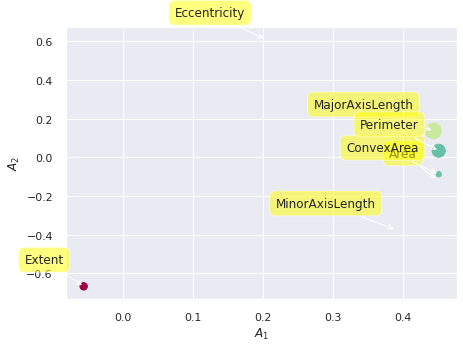

In [102]:
plt.scatter(A[:, 0],A[:, 1], marker='o', c=A[:, 2], s=A[:, 3]*500, cmap=plt.get_cmap('Spectral'))
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for label, x, y in zip(variables,A[:, 0],A[:, 1]):
  plt.annotate(label,xy=(x, y), xytext=(-20, 20),
      textcoords='offset points', ha='right', va='bottom',
      bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5),
      arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0'))

**Scree Plot**

Text(0, 0.5, 'Explained variance')

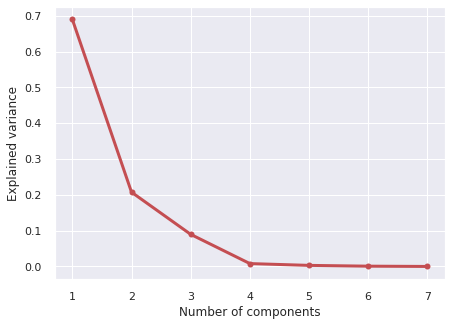

In [103]:
Lambda = pca.explained_variance_ 

#Scree plot
x = np.arange(len(Lambda)) + 1
plt.plot(x,Lambda/sum(Lambda), 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance')

**Explained Variance**

Text(0, 0.5, 'Cumulative explained variance')

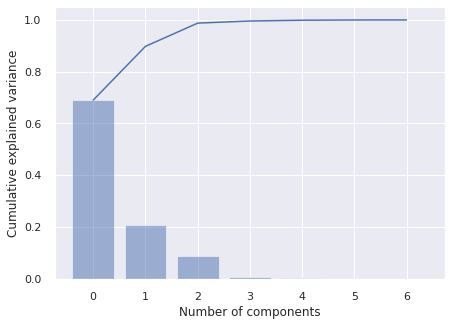

In [104]:
ell = pca.explained_variance_ratio_
ind = np.arange(len(ell))
plt.bar(ind, ell, align='center', alpha=0.5)
plt.plot(np.cumsum(ell))
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')

**Biplot**

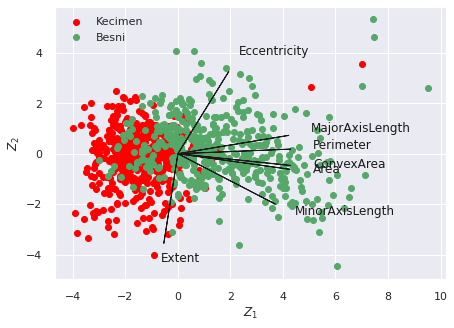

In [105]:
# 0,1 denote PC1 and PC2; change values for other PCs
A1 = A[:,0] 
A2 = A[:,1]
Z1 = Z[:,0] 
Z2 = Z[:,1]

plt.figure()
plt.xlabel('$Z_1$')
plt.ylabel('$Z_2$')
for i in range(len(A1)):
# arrows project features as vectors onto PC axes
  plt.arrow(0, 0, A1[i]*max(Z1), A2[i]*max(Z2), color='k', width=0.0005, head_width=0.0025)
  plt.text(A1[i]*max(Z1)*1.2, A2[i]*max(Z2)*1.2,variables[i], color='k')

plt.scatter(Z[idx_1,0], Z[idx_1,1], c='red', label='Kecimen')
plt.scatter(Z[idx_2,0], Z[idx_2,1], c='g', label='Besni')
plt.legend(loc='upper left')

# **Using PCA Library**

In [106]:
!pip install pca

In [107]:
from pca import pca
# Initialize and keep all PCs
model = pca()
# Fit transform
out = model.fit_transform(X)

[pca] >Processing dataframe..
[pca] >The PCA reduction is performed to capture [95.0%] explained variance using the [7] columns of the input data.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Number of components is [3] that covers the [95.00%] explained variance.
[pca] >The PCA reduction is performed on the [7] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[3]
[pca] >Outlier detection using SPE/DmodX with n_std=[2]


**Principal Components**

In [108]:
out['PC']

,PC1,PC2,PC3
0,0.076994,-0.453328,-1.089214
1,-0.475376,0.445368,0.016372
2,0.372109,0.802008,0.786487
3,-2.622445,-0.302564,0.482721
4,-0.962054,-2.967763,0.452154
...,...,...,...
895,-0.114629,0.694645,0.129914
896,0.273577,0.953934,0.696489
897,0.682451,-1.308199,0.091732
898,0.648410,0.979248,0.091413


**Scatter Plot**

(<Figure size 1440x1080 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7fe45fee6b50>)

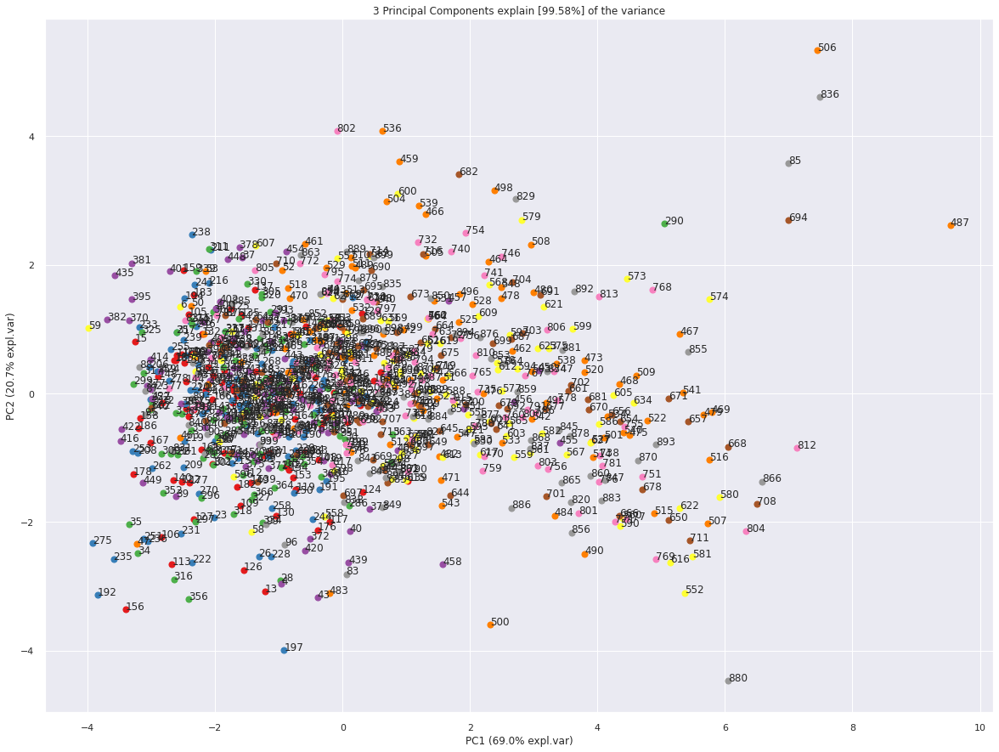

In [109]:
model.scatter(label=True, legend=False)

**Eigen Vectors**

In [110]:
A = out['loadings'].T

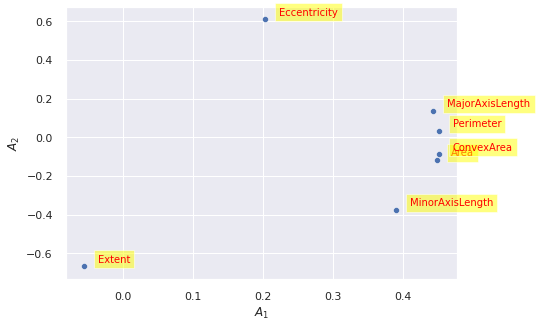

In [111]:
sns.scatterplot(data=A, x="PC1", y="PC2")
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for i in range(A.shape[0]):
 plt.text(x=A.PC1[i]+0.02,y=A.PC2[i]+0.02, s=variables[i],
          fontdict=dict(color='red',size=10),
          bbox=dict(facecolor='yellow',alpha=0.5))

**Scree Plot**

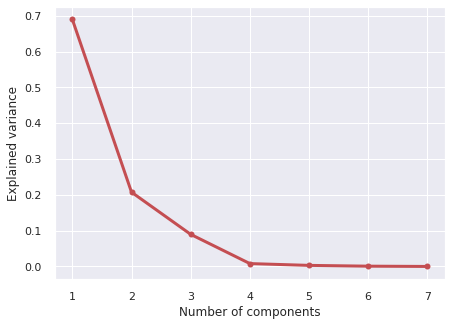

In [112]:
VR = out['variance_ratio']
x = np.arange(len(VR)) + 1
plt.plot(x, VR, 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance') 
plt.show()

**Explained Variance Plot**

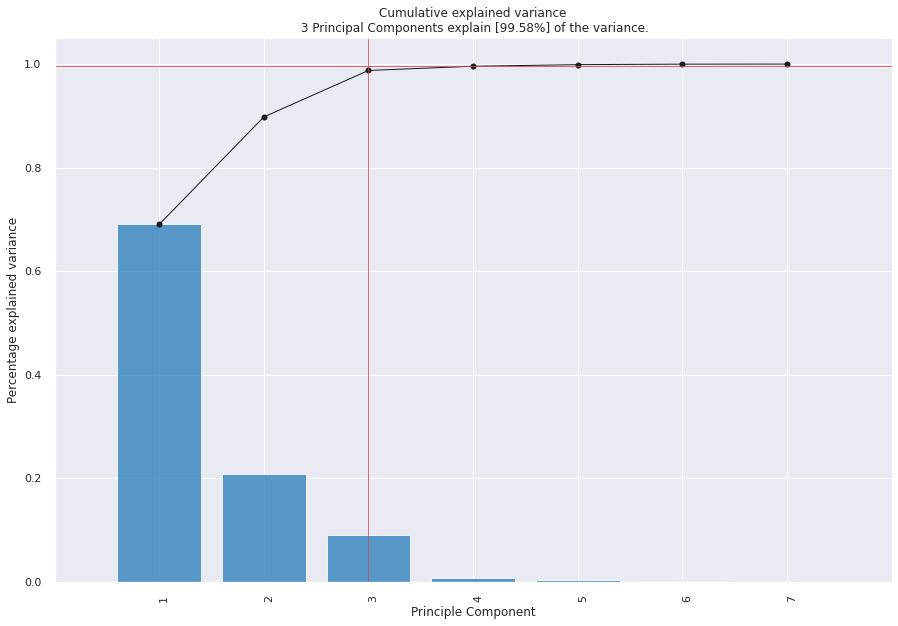

<Figure size 504x360 with 0 Axes>

In [113]:
model.plot();

**Biplot**

[pca] >Plot PC1 vs PC2 with loadings.


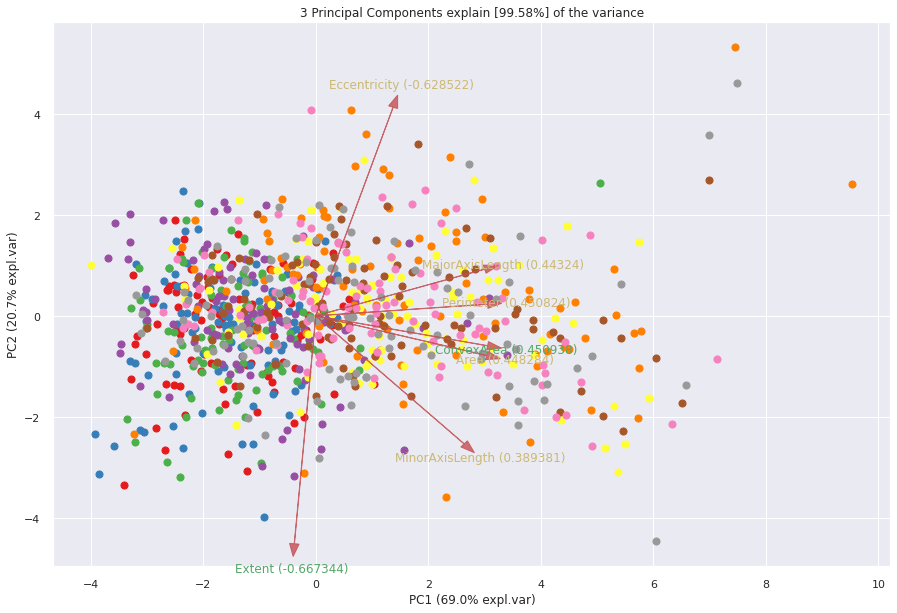

(<Figure size 1080x720 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7fe4641d3610>)

In [114]:
model.biplot(label=False, legend=False)

[pca] >Plot PC1 vs PC2 vs PC3 with loadings.


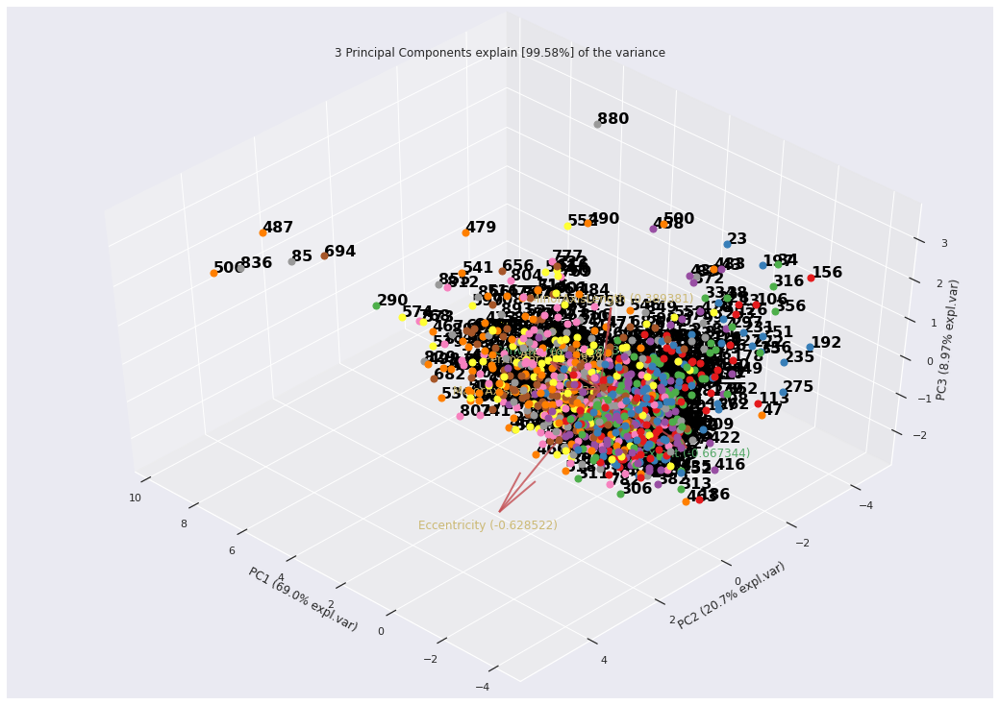

(<Figure size 1080x720 with 2 Axes>,
 <mpl_toolkits.mplot3d.axes3d.Axes3D at 0x7fe467f2c250>)

In [115]:
model.biplot3d(legend=False)

# **Classification**

**Using Pycaret**

In [116]:
from pycaret.utils import enable_colab 
enable_colab()

Colab mode enabled.


In order to demonstrate the predict_model() function on unseen data, a sample of 90 observations has been withheld from the original dataset to be used for predictions. This should not be confused with a train/test split as this particular split is performed to simulate a real life scenario. Another way to think about this is that these 90 records were not available at the time when the machine learning experiment was performed.

In [117]:
data = df.sample(frac=0.9, random_state=786)
data_unseen = df.drop(data.index)

data.reset_index(drop=True, inplace=True)
data_unseen.reset_index(drop=True, inplace=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))

Data for Modeling: (810, 8)
Unseen Data For Predictions: (90, 8)


**Setting up the environment in Pycaret**

The setup() function initializes the environment in pycaret and creates the transformation pipeline to prepare the data for modeling and deployment. setup() must be called before executing any other function in pycaret. It takes two mandatory parameters: a pandas dataframe and the name of the target column. All other parameters are optional and are used to customize the pre-processing pipeline (we will see them in later tutorials).

When setup() is executed, PyCaret's inference algorithm will automatically infer the data types for all features based on certain properties. The data type should be inferred correctly but this is not always the case. To account for this, PyCaret displays a table containing the features and their inferred data types after setup() is executed. If all of the data types are correctly identified enter can be pressed to continue or quit can be typed to end the expriment. Ensuring that the data types are correct is of fundamental importance in PyCaret as it automatically performs a few pre-processing tasks which are imperative to any machine learning experiment. These tasks are performed differently for each data type which means it is very important for them to be correctly configured.

In [118]:
from pycaret.classification import *
clf = setup(data=data, target='Class', train_size=0.7, session_id=5927)

,Description,Value
0,session_id,5927
1,Target,Class
2,Target Type,Binary
3,Label Encoded,None
4,Original Data,"(810, 8)"
5,Missing Values,False
6,Numeric Features,7
7,Categorical Features,0
8,Ordinal Features,False
9,High Cardinality Features,False




Once the setup has been succesfully executed it prints the information grid which contains several important pieces of information. Most of the information is related to the pre-processing pipeline which is constructed when setup() is executed. The majority of these features are out of scope for the purposes of this tutorial however a few important things to note at this stage include:

session_id : A pseduo-random number distributed as a seed in all functions for later reproducibility. If no session_id is passed, a random number is automatically generated that is distributed to all functions. In this experiment, the session_id is set as 5927 for later reproducibility.

Target Type : Binary or Multiclass. The Target type is automatically detected and shown. There is no difference in how the experiment is performed for Binary or Multiclass problems. All functionalities are identical.

Label Encoded : When the Target variable is of type string (i.e. 'Yes' or 'No') instead of 1 or 0, it automatically encodes the label into 1 and 0 and displays the mapping (0 : No, 1 : Yes) for reference.

Original Data : Displays the original shape of the dataset. In this experiment (810, 8) means 810 samples and 8 features including the class column.

Missing Values : When there are missing values in the original data this will show as True. For this experiment there are no missing values in the dataset.

Numeric Features : The number of features inferred as numeric. In this dataset, 7 out of 8 features are inferred as numeric.

Categorical Features : The number of features inferred as categorical. In this dataset, there are no categorical features.

Transformed Train Set : Displays the shape of the transformed training set. Notice that the original shape of (810, 8) is transformed into (566, 6) for the transformed train set.

Transformed Test Set : Displays the shape of the transformed test/hold-out set. There are 244 samples in test/hold-out set. This split is based on the default value of 70/30 that can be changed using the train_size parameter in setup.

Notice how a few tasks that are imperative to perform modeling are automatically handled such as missing value imputation, categorical encoding etc. Most of the parameters in setup() are optional and used for customizing the pre-processing pipeline.


In [119]:
best_model = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.8622,0.9276,0.8214,0.8799,0.8471,0.7217,0.7263,0.333
lda,Linear Discriminant Analysis,0.8604,0.9192,0.8215,0.8770,0.8462,0.7184,0.7228,0.014
ridge,Ridge Classifier,0.8568,0.0000,0.7984,0.8887,0.8382,0.7103,0.7173,0.013
qda,Quadratic Discriminant Analysis,0.8533,0.9235,0.7493,0.9225,0.8241,0.7011,0.7146,0.014
lightgbm,Light Gradient Boosting Machine,0.8446,0.9241,0.8179,0.8510,0.8313,0.6871,0.6914,0.091
et,Extra Trees Classifier,0.8445,0.9186,0.8103,0.8552,0.8290,0.6865,0.6912,0.461
ada,Ada Boost Classifier,0.8427,0.9161,0.8027,0.8609,0.8262,0.6828,0.6903,0.110
rf,Random Forest Classifier,0.8374,0.9257,0.7836,0.8591,0.8167,0.6712,0.6767,0.505
gbc,Gradient Boosting Classifier,0.8341,0.9231,0.7842,0.8544,0.8149,0.6650,0.6706,0.131
nb,Naive Bayes,0.8267,0.9078,0.7228,0.8854,0.7908,0.6468,0.6606,0.014


In [120]:
best_model

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=5927, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

**Create Logistic Regression**

In [121]:
lr = create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8246,0.9082,0.6923,0.9000,0.7826,0.6397,0.6552
1,0.8947,0.9491,0.8462,0.9167,0.8800,0.7865,0.7885
2,0.8421,0.8543,0.8889,0.8000,0.8421,0.6851,0.6889
3,0.8596,0.9691,0.8889,0.8276,0.8571,0.7196,0.7213
4,0.8596,0.9309,0.8519,0.8519,0.8519,0.7185,0.7185
5,0.9123,0.9185,0.8148,1.0000,0.8980,0.8224,0.8357
6,0.8750,0.9628,0.8077,0.9130,0.8571,0.7468,0.7512
7,0.9107,0.9410,0.8846,0.9200,0.9020,0.8201,0.8206
8,0.8393,0.9026,0.7692,0.8696,0.8163,0.6744,0.6784
9,0.8036,0.9397,0.7692,0.8000,0.7843,0.6041,0.6045


**Tune Logistic Regression**

In [122]:
tuned_lr = tune_model(lr)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8246,0.9107,0.7308,0.8636,0.7917,0.6420,0.6486
1,0.8947,0.9504,0.8462,0.9167,0.8800,0.7865,0.7885
2,0.8421,0.8556,0.8889,0.8000,0.8421,0.6851,0.6889
3,0.8596,0.9691,0.8889,0.8276,0.8571,0.7196,0.7213
4,0.8596,0.9309,0.8519,0.8519,0.8519,0.7185,0.7185
5,0.9123,0.9198,0.8148,1.0000,0.8980,0.8224,0.8357
6,0.8750,0.9628,0.8462,0.8800,0.8627,0.7481,0.7486
7,0.8929,0.9410,0.8846,0.8846,0.8846,0.7846,0.7846
8,0.8571,0.9038,0.8077,0.8750,0.8400,0.7113,0.7132
9,0.8036,0.9410,0.7692,0.8000,0.7843,0.6041,0.6045


**Evaluate Logistic regression**

In [123]:
evaluate_model(tuned_lr)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

**Craete Decision Tree Model**

In [124]:
dt = create_model('dt')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8070,0.8071,0.8077,0.7778,0.7925,0.6122,0.6126
1,0.8947,0.8908,0.8462,0.9167,0.8800,0.7865,0.7885
2,0.7895,0.7889,0.7778,0.7778,0.7778,0.5778,0.5778
3,0.8070,0.8111,0.8889,0.7500,0.8136,0.6165,0.6261
4,0.7544,0.7593,0.8519,0.6970,0.7667,0.5128,0.5244
5,0.8070,0.8037,0.7407,0.8333,0.7843,0.6108,0.6143
6,0.7857,0.7897,0.8462,0.7333,0.7857,0.5736,0.5795
7,0.8750,0.8756,0.8846,0.8519,0.8679,0.7494,0.7498
8,0.7857,0.7821,0.7308,0.7917,0.7600,0.5670,0.5685
9,0.8214,0.8205,0.8077,0.8077,0.8077,0.6410,0.6410


In [125]:
#trained model object is stored in the variable 'dt'. 
dt

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=5927, splitter='best')

In [126]:
tuned_dt = tune_model(dt)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8070,0.7916,0.6154,0.9412,0.7442,0.5999,0.6349
1,0.9123,0.9038,0.8077,1.0000,0.8936,0.8204,0.8340
2,0.8070,0.8000,0.6667,0.9000,0.7660,0.6079,0.6277
3,0.8947,0.8981,0.9630,0.8387,0.8966,0.7904,0.7983
4,0.8246,0.8259,0.8519,0.7931,0.8214,0.6494,0.6510
5,0.8421,0.8333,0.6667,1.0000,0.8000,0.6780,0.7161
6,0.8214,0.8103,0.6538,0.9444,0.7727,0.6335,0.6626
7,0.8929,0.8872,0.8077,0.9545,0.8750,0.7824,0.7907
8,0.7857,0.7718,0.5769,0.9375,0.7143,0.5579,0.6001
9,0.8036,0.8013,0.7692,0.8000,0.7843,0.6041,0.6045


In [127]:
#tuned model object is stored in the variable 'tuned_dt'. 
tuned_dt

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=2, max_features='log2', max_leaf_nodes=None,
                       min_impurity_decrease=0.4, min_impurity_split=None,
                       min_samples_leaf=4, min_samples_split=9,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=5927, splitter='best')

In [128]:
!pip install statsmodels --upgrade

In [129]:
evaluate_model(tuned_dt)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

**Create Random Forest**

In [154]:
rf = create_model('rf')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8421,0.9032,0.7692,0.8696,0.8163,0.6788,0.6827
1,0.9123,0.9529,0.8077,1.0000,0.8936,0.8204,0.8340
2,0.8070,0.8136,0.8148,0.7857,0.8000,0.6137,0.6141
3,0.8772,0.9525,0.8889,0.8571,0.8727,0.7542,0.7546
4,0.8246,0.9210,0.8519,0.7931,0.8214,0.6494,0.6510
5,0.8596,0.8815,0.7407,0.9524,0.8333,0.7154,0.7322
6,0.8929,0.9026,0.8077,0.9545,0.8750,0.7824,0.7907
7,0.8929,0.9385,0.8462,0.9167,0.8800,0.7835,0.7856
8,0.8036,0.8667,0.6923,0.8571,0.7660,0.6000,0.6102
9,0.8036,0.8904,0.7692,0.8000,0.7843,0.6041,0.6045


**Tune Random Forest**

In [156]:
tuned_rf = tune_model(rf)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8246,0.8821,0.7308,0.8636,0.7917,0.6420,0.6486
1,0.9123,0.9591,0.8077,1.0000,0.8936,0.8204,0.8340
2,0.8246,0.8296,0.7778,0.8400,0.8077,0.6468,0.6485
3,0.9123,0.9531,0.8889,0.9231,0.9057,0.8237,0.8243
4,0.8421,0.9296,0.8519,0.8214,0.8364,0.6839,0.6843
5,0.8947,0.8815,0.7778,1.0000,0.8750,0.7865,0.8051
6,0.8929,0.8782,0.8077,0.9545,0.8750,0.7824,0.7907
7,0.8929,0.9321,0.8077,0.9545,0.8750,0.7824,0.7907
8,0.7857,0.8628,0.6538,0.8500,0.7391,0.5625,0.5765
9,0.8214,0.8987,0.7692,0.8333,0.8000,0.6392,0.6408


**Evaluate Random Forest**

In [157]:
evaluate_model(tuned_rf)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

# **Tune the Best Model**

In [158]:
tuned_best_model = tune_model(best_model)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8421,0.9020,0.7692,0.8696,0.8163,0.6788,0.6827
1,0.8947,0.9529,0.8846,0.8846,0.8846,0.7878,0.7878
2,0.8246,0.8543,0.8519,0.7931,0.8214,0.6494,0.6510
3,0.8772,0.9667,0.9630,0.8125,0.8814,0.7560,0.7677
4,0.8070,0.9296,0.8148,0.7857,0.8000,0.6137,0.6141
5,0.8947,0.9210,0.8148,0.9565,0.8800,0.7873,0.7953
6,0.8929,0.9487,0.8077,0.9545,0.8750,0.7824,0.7907
7,0.9107,0.9333,0.8462,0.9565,0.8980,0.8191,0.8240
8,0.8571,0.8923,0.8077,0.8750,0.8400,0.7113,0.7132
9,0.8036,0.9038,0.7692,0.8000,0.7843,0.6041,0.6045


In [159]:
tuned_best_model

LogisticRegression(C=8.674999999999999, class_weight={}, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=1000, multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=5927, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

**Create K Neighbour**

In [151]:
knn = create_model('knn')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8246,0.8610,0.7308,0.8636,0.7917,0.6420,0.6486
1,0.9298,0.9491,0.8462,1.0000,0.9167,0.8568,0.8657
2,0.7544,0.8352,0.6667,0.7826,0.7200,0.5037,0.5089
3,0.8596,0.9204,0.8148,0.8800,0.8462,0.7175,0.7193
4,0.7895,0.8957,0.8148,0.7586,0.7857,0.5793,0.5808
5,0.8947,0.9043,0.8148,0.9565,0.8800,0.7873,0.7953
6,0.8929,0.8846,0.8077,0.9545,0.8750,0.7824,0.7907
7,0.8393,0.9321,0.8077,0.8400,0.8235,0.6761,0.6765
8,0.8214,0.8878,0.6923,0.9000,0.7826,0.6354,0.6512
9,0.7857,0.8442,0.7308,0.7917,0.7600,0.5670,0.5685


In [152]:
tuned_knn = tune_model(knn, custom_grid = {'n_neighbors' : np.arange(0,50,1)})

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.7895,0.9175,0.6154,0.8889,0.7273,0.5649,0.5903
1,0.9123,0.9615,0.8462,0.9565,0.8980,0.8215,0.8263
2,0.8246,0.8457,0.8148,0.8148,0.8148,0.6481,0.6481
3,0.9123,0.9648,0.9259,0.8929,0.9091,0.8244,0.8249
4,0.8947,0.9333,0.8519,0.9200,0.8846,0.7881,0.7901
5,0.8772,0.9210,0.7407,1.0000,0.8511,0.7505,0.7750
6,0.8929,0.9462,0.8077,0.9545,0.8750,0.7824,0.7907
7,0.8750,0.9269,0.8077,0.9130,0.8571,0.7468,0.7512
8,0.8214,0.8865,0.6923,0.9000,0.7826,0.6354,0.6512
9,0.8214,0.9173,0.7308,0.8636,0.7917,0.6373,0.6441


In [153]:
evaluate_model(tuned_knn)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

**Evaluate the best model**

In [160]:
evaluate_model(tuned_best_model)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

# **Classification + PCA**

In [69]:
clf_pca = setup(data=data, target='Class', train_size=0.7, session_id=5927, normalize = True, pca = True, pca_components = 3)

,Description,Value
0,session_id,5927
1,Target,Class
2,Target Type,Binary
3,Label Encoded,None
4,Original Data,"(810, 8)"
5,Missing Values,False
6,Numeric Features,7
7,Categorical Features,0
8,Ordinal Features,False
9,High Cardinality Features,False


In [74]:
best_model_pca = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.8587,0.9206,0.8291,0.8682,0.8456,0.7153,0.7197,0.017
nb,Naive Bayes,0.8516,0.9191,0.7537,0.9179,0.8241,0.6982,0.7119,0.015
rf,Random Forest Classifier,0.8516,0.9023,0.7989,0.8786,0.8343,0.7002,0.7060,0.498
et,Extra Trees Classifier,0.8515,0.9078,0.7952,0.8788,0.8337,0.6999,0.7042,0.462
ridge,Ridge Classifier,0.8498,0.0000,0.7761,0.8923,0.8275,0.6955,0.7035,0.012
lda,Linear Discriminant Analysis,0.8498,0.9183,0.7761,0.8923,0.8275,0.6955,0.7035,0.013
svm,SVM - Linear Kernel,0.8446,0.0000,0.7990,0.8661,0.8264,0.6863,0.6938,0.014
qda,Quadratic Discriminant Analysis,0.8409,0.9056,0.7380,0.9063,0.8110,0.6762,0.6894,0.014
knn,K Neighbors Classifier,0.8392,0.8914,0.7726,0.8728,0.8181,0.6747,0.6806,0.114
lightgbm,Light Gradient Boosting Machine,0.8392,0.8946,0.7950,0.8521,0.8212,0.6753,0.6783,0.085


In [75]:
best_model_pca

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=5927, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

### **Tune the best model**

In [161]:
tuned_best_model_pca = tune_model(best_model_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8421,0.9020,0.7692,0.8696,0.8163,0.6788,0.6827
1,0.8947,0.9529,0.8846,0.8846,0.8846,0.7878,0.7878
2,0.8246,0.8543,0.8519,0.7931,0.8214,0.6494,0.6510
3,0.8772,0.9667,0.9630,0.8125,0.8814,0.7560,0.7677
4,0.8070,0.9296,0.8148,0.7857,0.8000,0.6137,0.6141
5,0.8947,0.9210,0.8148,0.9565,0.8800,0.7873,0.7953
6,0.8929,0.9487,0.8077,0.9545,0.8750,0.7824,0.7907
7,0.9107,0.9333,0.8462,0.9565,0.8980,0.8191,0.8240
8,0.8571,0.8923,0.8077,0.8750,0.8400,0.7113,0.7132
9,0.8036,0.9038,0.7692,0.8000,0.7843,0.6041,0.6045


In [162]:
tuned_best_model_pca

LogisticRegression(C=8.674999999999999, class_weight={}, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=1000, multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=5927, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

**Evaluate the best model**

In [163]:
evaluate_model(tuned_best_model_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

# **Explainable AI with shapely values**

In [143]:
!pip install shap

     |████████████████████████████████| 564 kB 8.3 MB/s 


In [144]:
import shap

In [145]:
rf_pca = create_model('rf')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8421,0.9032,0.7692,0.8696,0.8163,0.6788,0.6827
1,0.9123,0.9529,0.8077,1.0000,0.8936,0.8204,0.8340
2,0.8070,0.8136,0.8148,0.7857,0.8000,0.6137,0.6141
3,0.8772,0.9525,0.8889,0.8571,0.8727,0.7542,0.7546
4,0.8246,0.9210,0.8519,0.7931,0.8214,0.6494,0.6510
5,0.8596,0.8815,0.7407,0.9524,0.8333,0.7154,0.7322
6,0.8929,0.9026,0.8077,0.9545,0.8750,0.7824,0.7907
7,0.8929,0.9385,0.8462,0.9167,0.8800,0.7835,0.7856
8,0.8036,0.8667,0.6923,0.8571,0.7660,0.6000,0.6102
9,0.8036,0.8904,0.7692,0.8000,0.7843,0.6041,0.6045


In [146]:
tuned_rf_pca = tune_model(rf_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8246,0.8821,0.7308,0.8636,0.7917,0.6420,0.6486
1,0.9123,0.9591,0.8077,1.0000,0.8936,0.8204,0.8340
2,0.8246,0.8296,0.7778,0.8400,0.8077,0.6468,0.6485
3,0.9123,0.9531,0.8889,0.9231,0.9057,0.8237,0.8243
4,0.8421,0.9296,0.8519,0.8214,0.8364,0.6839,0.6843
5,0.8947,0.8815,0.7778,1.0000,0.8750,0.7865,0.8051
6,0.8929,0.8782,0.8077,0.9545,0.8750,0.7824,0.7907
7,0.8929,0.9321,0.8077,0.9545,0.8750,0.7824,0.7907
8,0.7857,0.8628,0.6538,0.8500,0.7391,0.5625,0.5765
9,0.8214,0.8987,0.7692,0.8333,0.8000,0.6392,0.6408


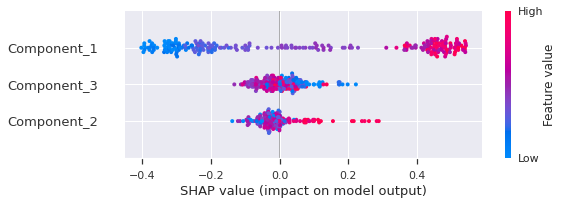

In [147]:
interpret_model(tuned_rf_pca, plot='summary')

In [148]:
#explainer = shap.TreeExplainer(tuned_rf_pca)
#X = df.drop('class', axis=1)
#shap_values = explainer.shap_values(X)
#shap.summary_plot(shap_values, X)

## **Visualize Single Prediction**

In [149]:
interpret_model(tuned_rf_pca, plot='reason', observation=32)

In [150]:
interpret_model(tuned_rf_pca, plot='reason')